<font size="+3">심층 컨볼루션 생성 적대 신경망(DCGAN)</font>

Python을 사용한 GAN 구현을 설명하기 위해 'GAN 아키텍처의 진화' 섹션에서 논의한 [심층 컨벌루션 GAN](https://arxiv.org/abs/1511.06434)(DCGAN) 예제를 사용하여 패션 MNIST 데이터세트의 이미지를 합성합니다.

DCGAN 아키텍처를 사용한 생성 모델링에 대한 [텐서플로우 튜토리얼](https://www.tensorflow.org/tutorials/generative/dcgan)에서 채택되었습니다.

# 가져오기 및 설정

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
from pathlib import Path
import imageio
import matplotlib.pyplot as plt
from tqdm import tqdm
from time import time

import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import (Dense, Reshape, Flatten, Dropout,
                                     BatchNormalization, LeakyReLU,
                                     Conv2D, Conv2DTranspose)
from tensorflow.keras.models import Sequential
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

from IPython import display

In [3]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if gpu_devices:
    print('Using GPU')
    tf.config.experimental.set_memory_growth(gpu_devices[0], True)
else:
    print('Using CPU')

Using CPU


In [4]:
dcgan_path = Path('dcgan')
img_path = dcgan_path / 'synthetic_images'
if not img_path.exists():
    img_path.mkdir(parents=True)

# 샘플 이미지 보호기

In [5]:
def generate_and_save_images(model, epoch, test_input):
    # Training set to false so that every layer runs in inference mode
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(5, 5.2))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    fig.suptitle(f'Epoch {epoch:03d}', fontsize=14)
    fig.tight_layout()
    fig.subplots_adjust(top=.93)
    fig.savefig(img_path / f'epoch_{epoch:03d}.png', dpi=300)
    plt.show()

# 데이터 로드 및 준비

## 학습 이미지 가져오기

In [6]:
# use only train images
(train_images, train_labels), (_, _) = fashion_mnist.load_data()

4423680/4422102 [==============================] - 0s 0us/step


## 이미지 크기 추출

In [7]:
# get dimensionality
n_images = train_images.shape[0]
h = w = 28

## 4D 입력 형식으로 변형

In [8]:
train_images = (train_images
                .reshape(n_images, h, w, 1)
                .astype('float32'))

## 픽셀 값 정규화

In [9]:
# Normalize the images in between -1 and 1
train_images = (train_images - 127.5) / 127.5

## `tf.data.Dataset` 만들기

In [10]:
BUFFER_SIZE = n_images
BATCH_SIZE = 256

In [11]:
train_set = (tf.data.Dataset
             .from_tensor_slices(train_images)
             .shuffle(BUFFER_SIZE)
             .batch(BATCH_SIZE))

In [12]:
train_set

<BatchDataset shapes: (None, 28, 28, 1), types: tf.float32>

# DCGAN 아키텍처 생성

## 생성기 빌드

In [13]:
def build_generator():
    return Sequential([Dense(7 * 7 * 256, 
                             use_bias=False,
                             input_shape=(100,), 
                             name='IN'),
                       BatchNormalization(name='BN1'),
                       LeakyReLU(name='RELU1'),
                       Reshape((7, 7, 256), name='SHAPE1'),
                       Conv2DTranspose(128, (5, 5), 
                                       strides=(1, 1),
                                       padding='same', 
                                       use_bias=False,
                                       name='CONV1'),
                       BatchNormalization(name='BN2'),
                       LeakyReLU(name='RELU2'),
                       Conv2DTranspose(64, (5, 5), 
                                       strides=(2, 2),
                                       padding='same', use_bias=False,
                                       name='CONV2'),
                       BatchNormalization(name='BN3'),
                       LeakyReLU(name='RELU3'),
                       Conv2DTranspose(1, (5, 5), 
                                       strides=(2, 2),
                                       padding='same', 
                                       use_bias=False,
                                       activation='tanh', 
                                       name='CONV3')],
                      name='Generator')

In [14]:
generator = build_generator()

In [15]:
generator.summary()

Model: "Generator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
IN (Dense)                   (None, 12544)             1254400   
_________________________________________________________________
BN1 (BatchNormalization)     (None, 12544)             50176     
_________________________________________________________________
RELU1 (LeakyReLU)            (None, 12544)             0         
_________________________________________________________________
SHAPE1 (Reshape)             (None, 7, 7, 256)         0         
_________________________________________________________________
CONV1 (Conv2DTranspose)      (None, 7, 7, 128)         819200    
_________________________________________________________________
BN2 (BatchNormalization)     (None, 7, 7, 128)         512       
_________________________________________________________________
RELU2 (LeakyReLU)            (None, 7, 7, 128)         0 

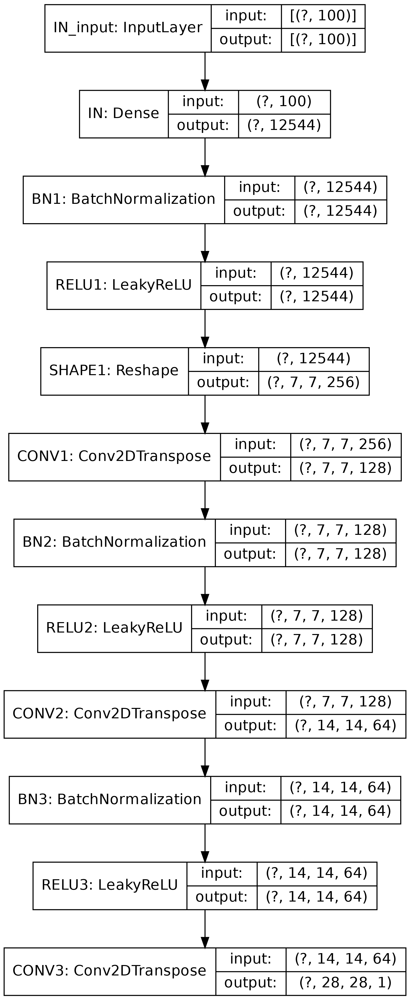

In [16]:
plot_model(generator,
           show_shapes=True,
           dpi=300,
           to_file=(dcgan_path / 'generator.png').as_posix())

### 초기 이미지 품질 시각화

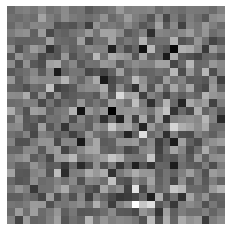

In [17]:
noise = tf.random.normal([1, 100])
generated_img = generator(noise, training=False)

plt.imshow(generated_img[0, :, :, 0], cmap='gray')
plt.axis('off');

## 판별기 구축

판별자와 생성자는 모두 함수로 래핑된 심층 CNN 아키텍처를 사용합니다.

In [18]:
def build_discriminator():
    return Sequential([Conv2D(64, (5, 5), 
                              strides=(2, 2), 
                              padding='same',
                              input_shape=[28, 28, 1], 
                              name='CONV1'),
                       LeakyReLU(name='RELU1'),
                       Dropout(0.3, name='DO1'),
                       Conv2D(128, (5, 5), 
                              strides=(2, 2),
                              padding='same', 
                              name='CONV2'),
                       LeakyReLU(name='RELU2'),
                       Dropout(0.3, name='DO2'),
                       Flatten(name='FLAT'),
                       Dense(1, name='OUT')],
                      name='Discriminator')

In [19]:
discriminator = build_discriminator()

In [20]:
discriminator.summary()

Model: "Discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
CONV1 (Conv2D)               (None, 14, 14, 64)        1664      
_________________________________________________________________
RELU1 (LeakyReLU)            (None, 14, 14, 64)        0         
_________________________________________________________________
DO1 (Dropout)                (None, 14, 14, 64)        0         
_________________________________________________________________
CONV2 (Conv2D)               (None, 7, 7, 128)         204928    
_________________________________________________________________
RELU2 (LeakyReLU)            (None, 7, 7, 128)         0         
_________________________________________________________________
DO2 (Dropout)                (None, 7, 7, 128)         0         
_________________________________________________________________
FLAT (Flatten)               (None, 6272)            

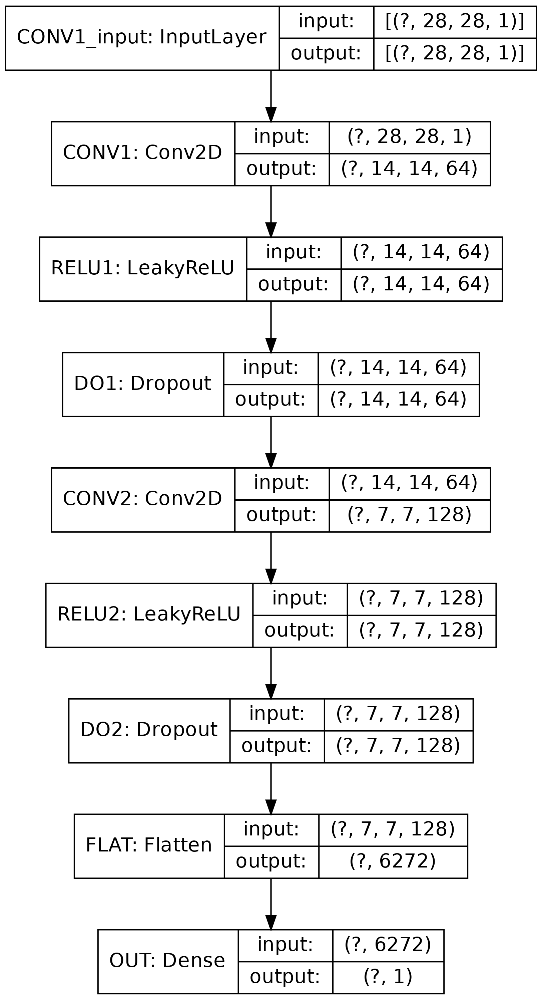

In [21]:
plot_model(discriminator,
           show_shapes=True,
           dpi=300,
           to_file=(dcgan_path / 'discriminator.png').as_posix())

### 판별자 결정 출력 표시

In [22]:
discriminator(generated_img).numpy()

array([[-0.00111907]], dtype=float32)

# 적대적 훈련

In [23]:
cross_entropy = BinaryCrossentropy(from_logits=True)

## 발전기 손실

In [24]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

## 판별자 손실

In [25]:
def discriminator_loss(true_output, fake_output):
    true_loss = cross_entropy(tf.ones_like(true_output), true_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return true_loss + fake_loss

## 옵티마이저

In [26]:
gen_optimizer = Adam(1e-4)
dis_optimizer = Adam(1e-4)

## 체크포인트

In [27]:
checkpoints_dir = dcgan_path / 'training_chpk'
checkpoint_prefix = checkpoints_dir / 'ckpt'
checkpoint = tf.train.Checkpoint(gen_optimizer=gen_optimizer,
                                 dis_optimizer=dis_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## 훈련 매개변수

In [28]:
EPOCHS = 100
noise_dim = 100

In [29]:
# for gif generation
num_ex_to_gen = 16
seed = tf.random.normal([num_ex_to_gen, noise_dim])

학습은 이미지를 생성하는 데 사용되는 입력으로 임의의 시드가 제공된 생성기에서 시작됩니다. 판별자의 역할은 훈련 세트의 실제 이미지와 생성기의 가짜 이미지를 비교하는 것입니다. 그런 다음 모델 모두에 대해 손실이 계산되고 경사하강법을 통해 가중치가 업데이트됩니다. 더 나아가 실제 이미지에 가까운 가짜 이미지를 생성할 수 있는 효율적인 생성기와 실제 이미지와 가짜 이미지를 정확하게 구별할 수 있는 정확한 판별기를 갖게 될 것입니다.

## 훈련 단계

In [31]:
@tf.function
def train_step(images):
    # generate the random input for the generator
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # get the generator output
        generated_img = generator(noise, training=True)
        
        # collect discriminator decisions regarding real and fake input
        true_output = discriminator(images, training=True)
        fake_output = discriminator(generated_img, training=True)
        
        # compute the loss for each model
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(true_output, fake_output)
        
    # compute the gradients for each loss with respect to the model variables
    grad_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    grad_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # apply the gradient to complete the backpropagation step
    gen_optimizer.apply_gradients(zip(grad_generator, generator.trainable_variables))
    dis_optimizer.apply_gradients(zip(grad_discriminator, discriminator.trainable_variables))

## 훈련 루프

In [32]:
def train(dataset, epochs, save_every=10):
    for epoch in tqdm(range(epochs)):
        start = time()

        for img_batch in dataset:
            train_step(img_batch)

        # produce images for the GIF as we go
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)

        # Save the model every 10 EPOCHS
        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        # Generator after final epoch
    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, seed)

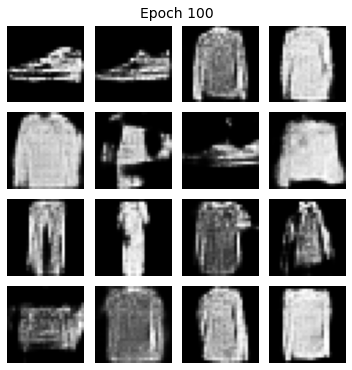

In [33]:
train(train_set, EPOCHS)

## 마지막 체크포인트 복원

In [34]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoints_dir));

# 애니메이션 GIF 생성

In [35]:
out_file = dcgan_path / 'fashion_mnist.gif'

In [36]:
with imageio.get_writer(out_file, mode='I') as writer:
    filenames = sorted(list(img_path.glob('*.png')))
    
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2 * (i ** 0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

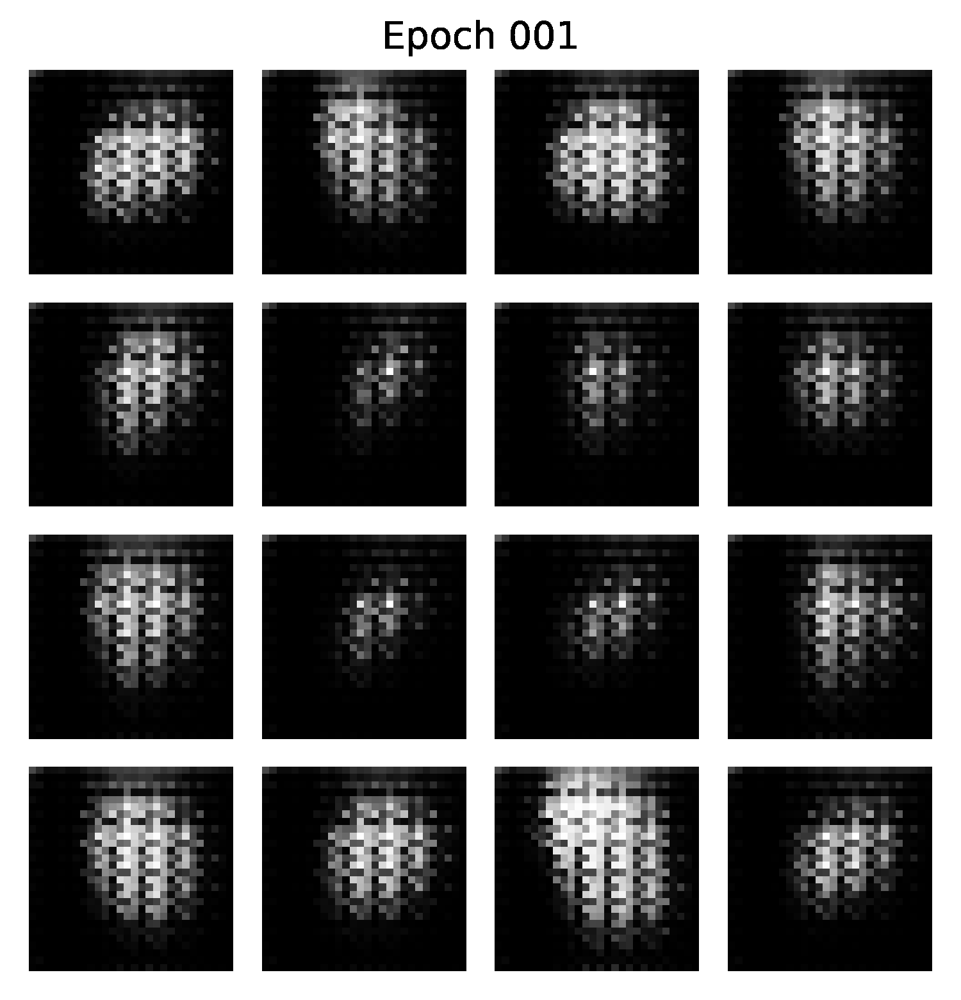

In [37]:
display.Image(filename=out_file)